In [1]:
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
import functions as f
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format ='retina'

#### Importing the Planck15 Raw CMB data from https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/

In [2]:
CMB_map_names = ["LFI_SkyMap_030_1024_R2.01_full.fits",
                 "LFI_SkyMap_044_1024_R2.01_full.fits" ,
                 "LFI_SkyMap_070_1024_R2.01_full.fits",
                 "HFI_SkyMap_100_2048_R2.02_full.fits", 
                 "HFI_SkyMap_143_2048_R2.02_full.fits",
                 "HFI_SkyMap_217_2048_R2.02_full.fits", 
                 "HFI_SkyMap_353_2048_R2.02_full.fits", 
                 "HFI_SkyMap_545_2048_R2.02_full.fits", 
                 "HFI_SkyMap_857_2048_R2.02_full.fits",];

In [237]:
CMB_maps = []
for i in CMB_map_names[:6]:
    
    temp = hp.read_map("../CMB_maps/%s"%(i))
    temp2 = hp.pixelfunc.ud_grade(temp, 512, order_in='RING') #to have the same resolution for all maps
    CMB_maps.append(temp2*1e6)

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


#### Raw data maps for all 9 frequencies


0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The inter

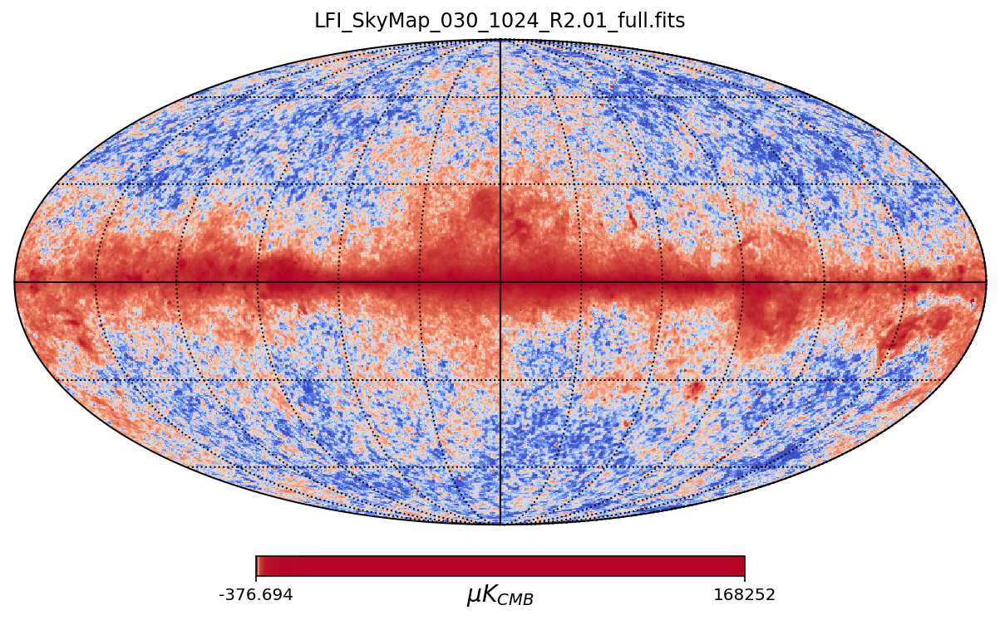

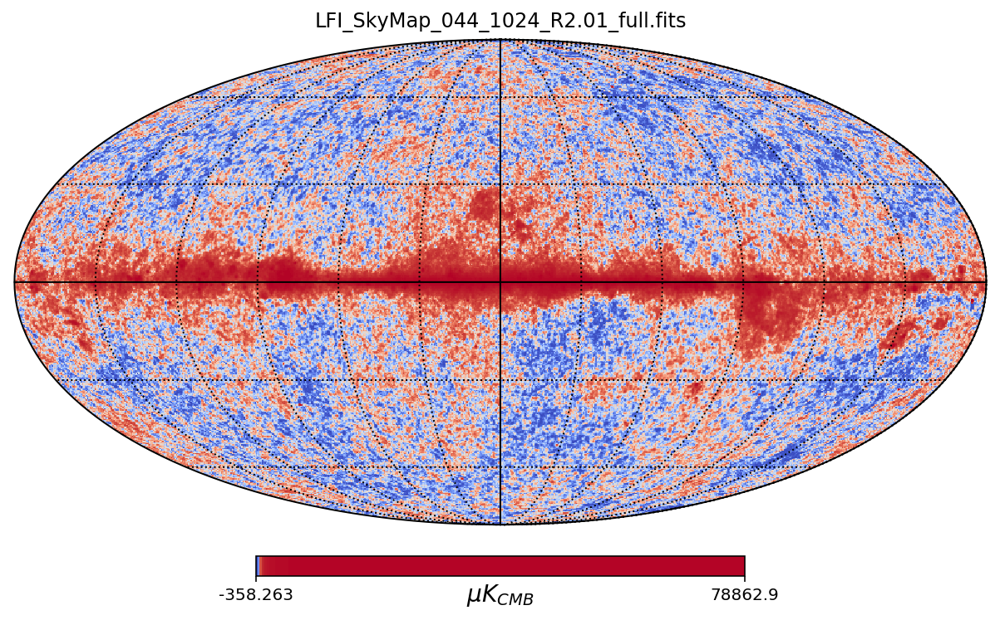

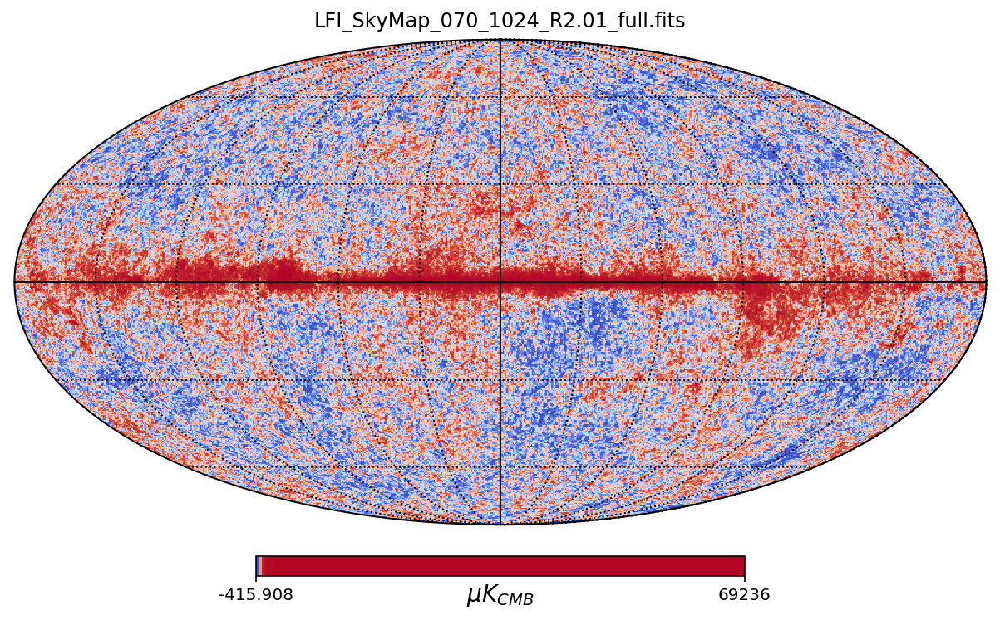

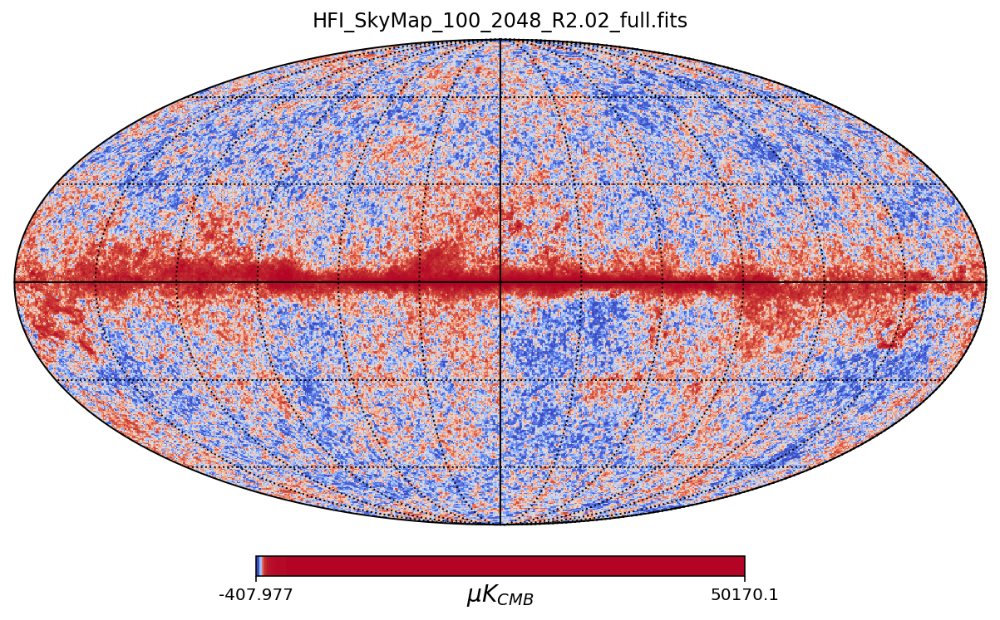

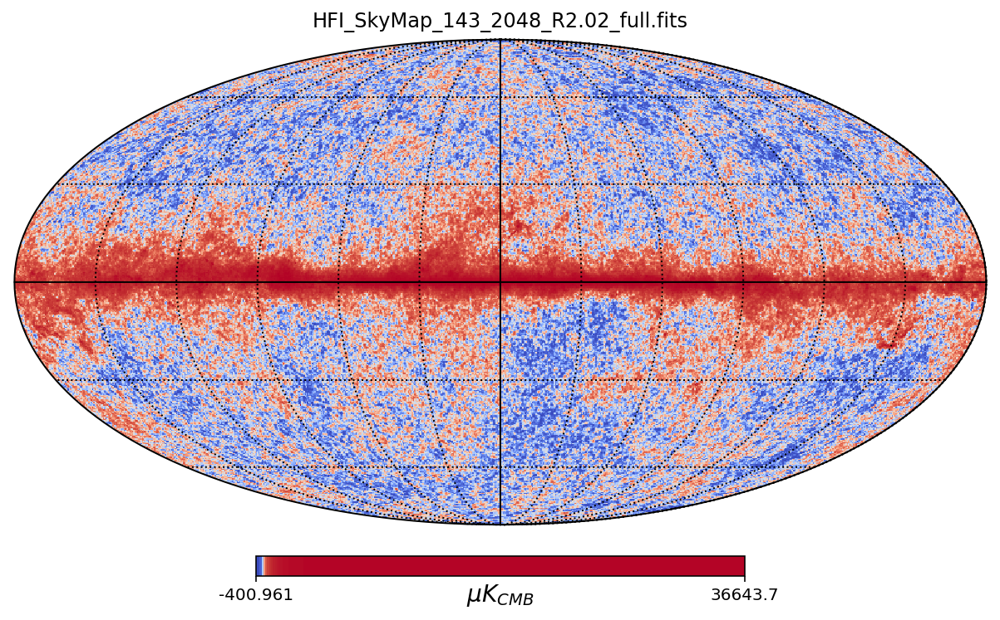

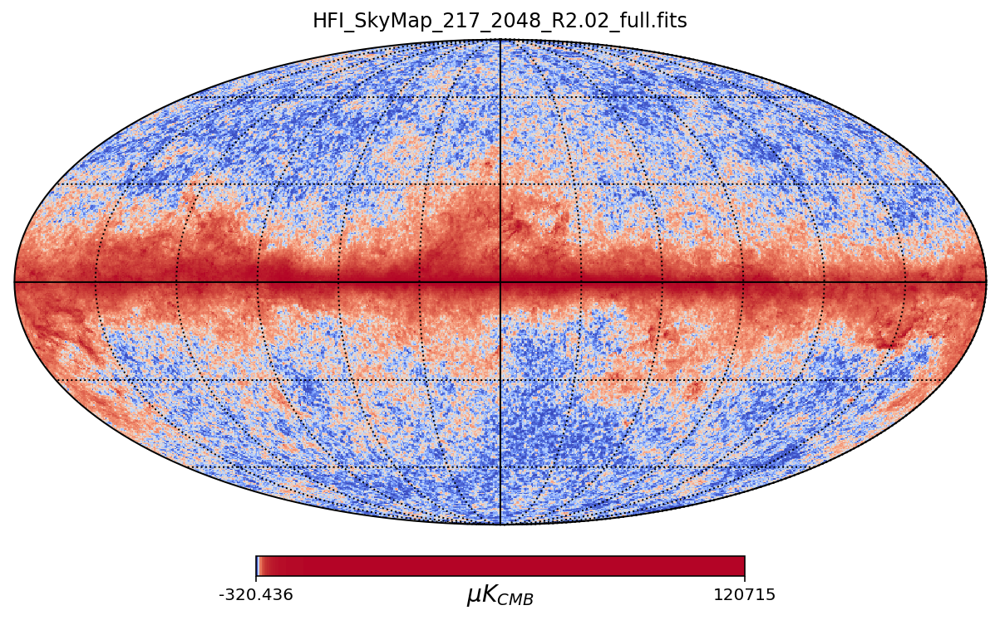

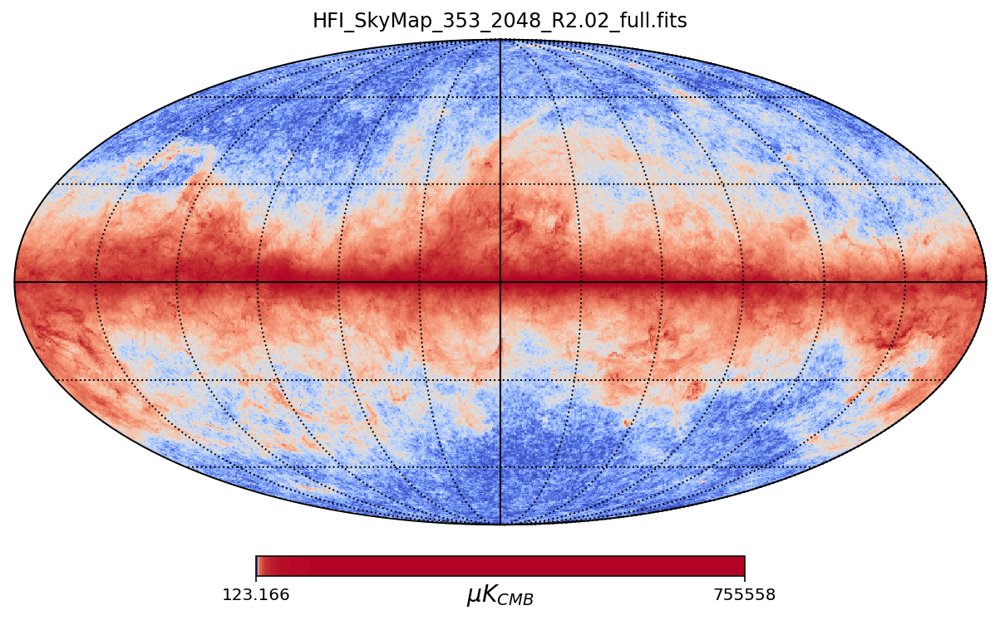

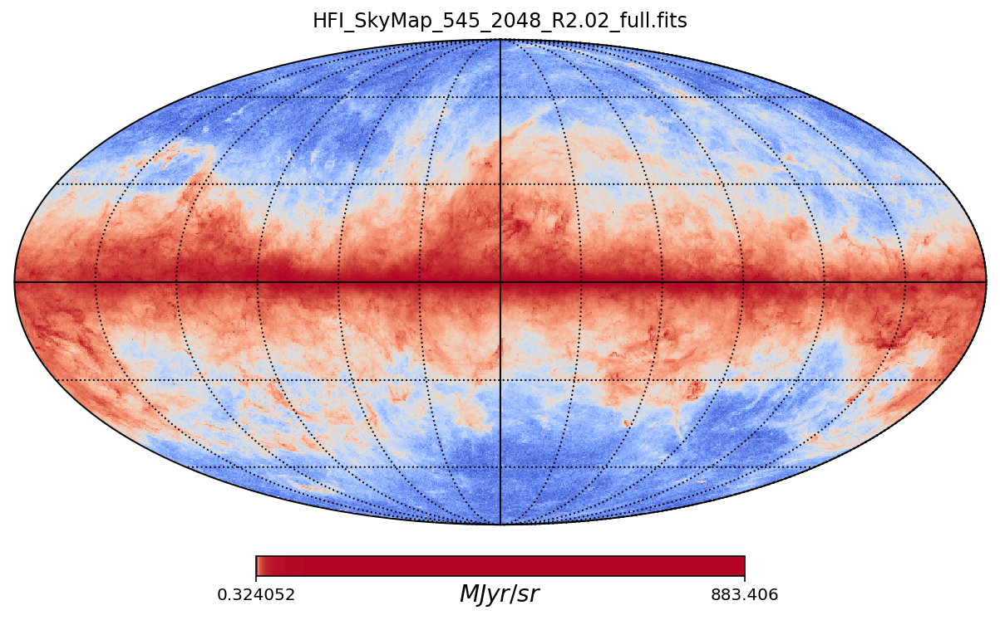

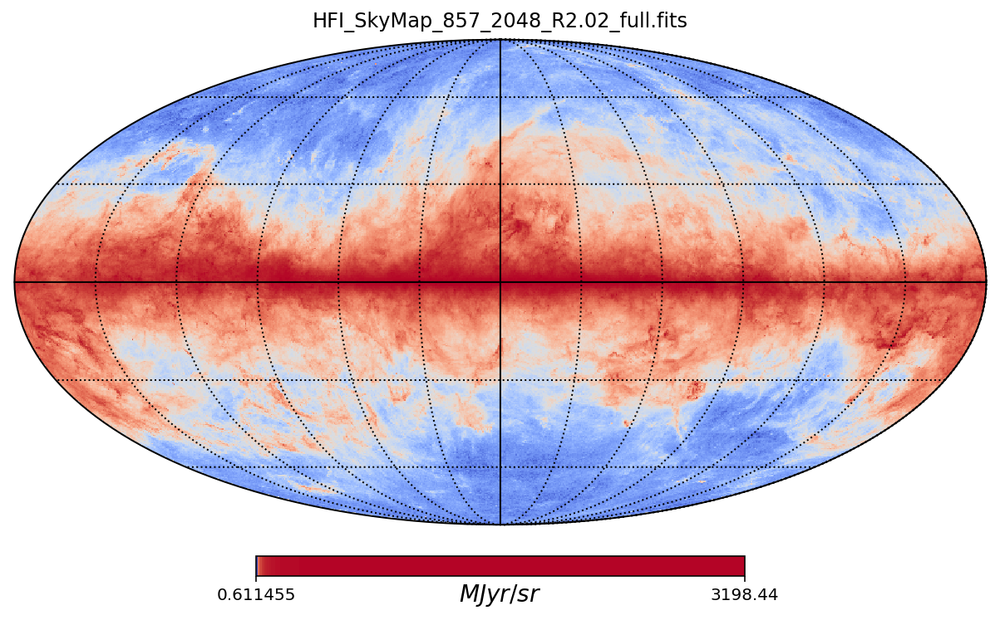

In [4]:
u = r"$\mu K_{CMB}$"
u2 = r"$MJyr/sr$"
for i in range(len(CMB_maps)):
    if i < 7 :
        hp.mollview( (10**6)*CMB_maps[i], unit= u ,norm="hist", title=CMB_map_names[i], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
    else: 
        hp.mollview( CMB_maps[i], unit= u2 ,norm="hist", title=CMB_map_names[i], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
        
    hp.graticule()


## Data Analysis
#### First, a few important things:
the signal is given in different units depending on the band : "The signal is given in units of Kcmb for 30-353 GHz, or MJy/sr (for a constant νFν energy distribution ) for 545 and 857 GHz." Hence we need to convert the 2 highest bands to the units $K_{cmb}$.

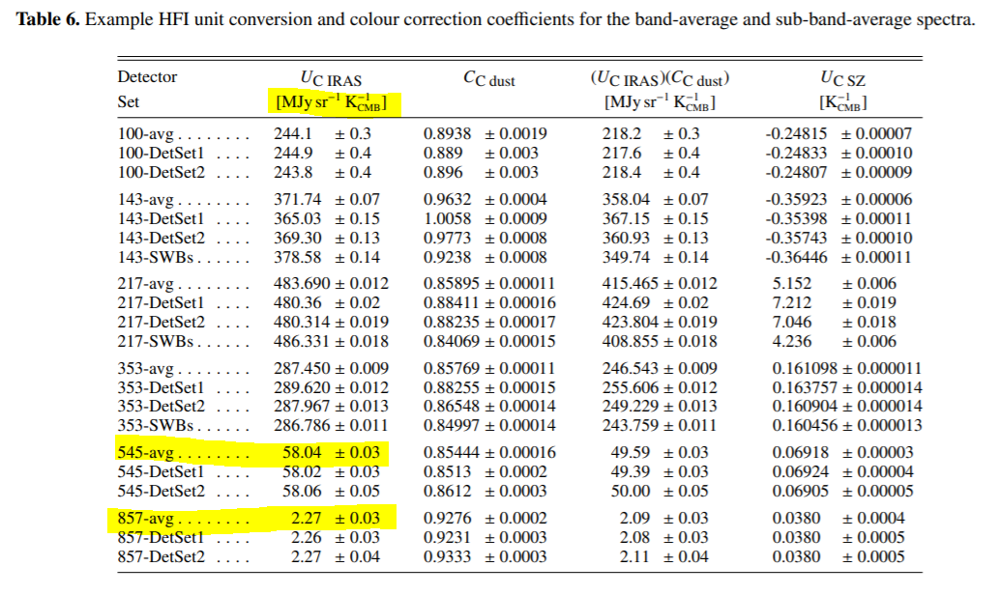

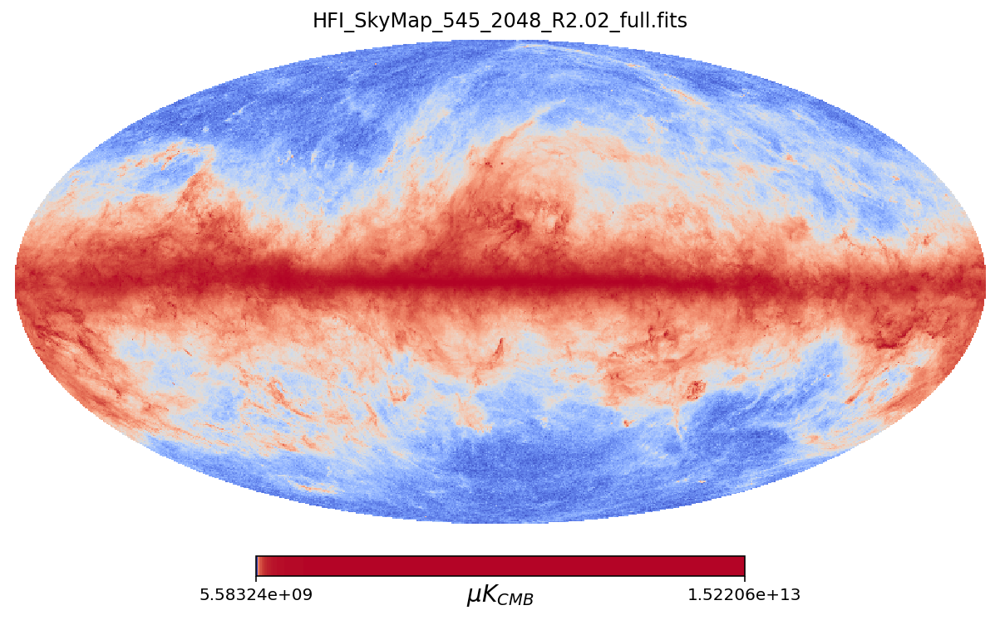

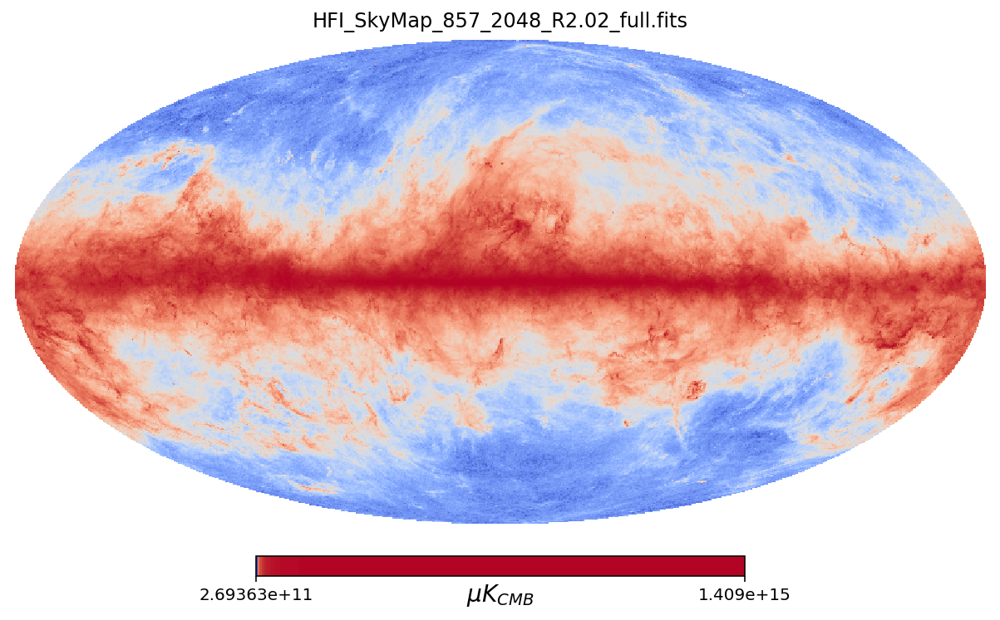

In [203]:
# the diff frequencies
freq = [30,44,70,100,143,217,353,545,857]

#the HFI where not obtained in the same units as the LFI, there exist some conversion factors:
conv_factors = [1/58.04,1/2.27]

CMB_maps_cor =[]
for i in range(2):
    #convert
    CMB_maps_cor.append(conv_factors[i]*CMB_maps[7+i])

    #visualize
    hp.mollview( (10**6)*CMB_maps_cor[i], unit = u ,norm="hist", title=CMB_map_names[i+7], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )


In [238]:
#doing Tegmark paper's determination of regions
#step 1
%autoreload 2
#CMB_maps[7] = CMB_maps_cor[0]
#CMB_maps[8] = CMB_maps_cor[1]


diff_maps = []
for i in range(len(CMB_maps)-1):
    diff_maps.append(CMB_maps[i]-CMB_maps[1+i])
    
#step 2
abs_diff_maps = np.abs(np.transpose(diff_maps))
junk_map = np.array([np.max(i) for i in abs_diff_maps])

#code to downsample the junk_map
#junk_map = hp.pixelfunc.ud_grade(junk_map, 64)
#junk_map = hp.pixelfunc.ud_grade(junk_map, 512)

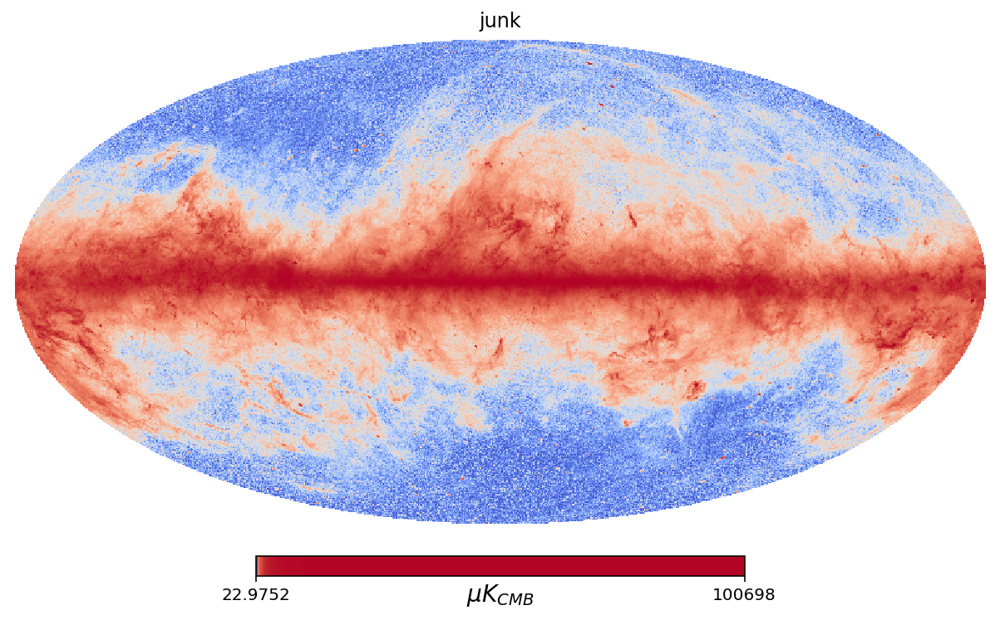

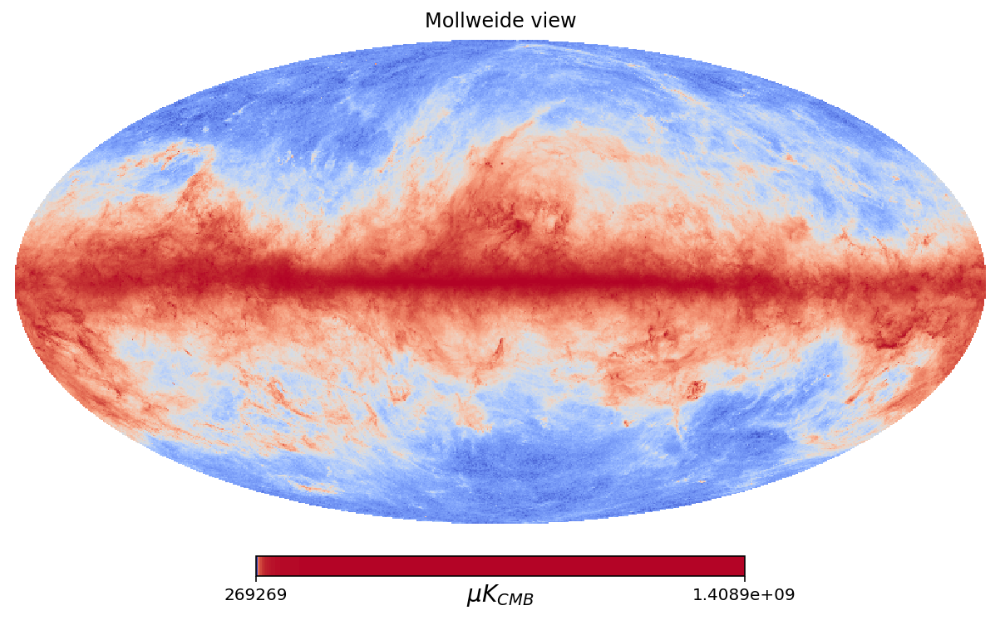

In [239]:
#comparing junk map to 800-band map
hp.mollview( junk_map, unit= u ,norm="hist", title='junk', cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
hp.mollview( (CMB_maps_cor[1] - junk_map), unit= u ,norm="hist", cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )

### Region Finding (based on junk map)

the bin edges aka regions [1.58279941e+01 4.55599972e+01 1.31141908e+02 3.77484658e+02
 1.08656851e+03 3.12762677e+03 9.00269901e+03 2.59137664e+04
 7.45913294e+04 2.14706976e+05]


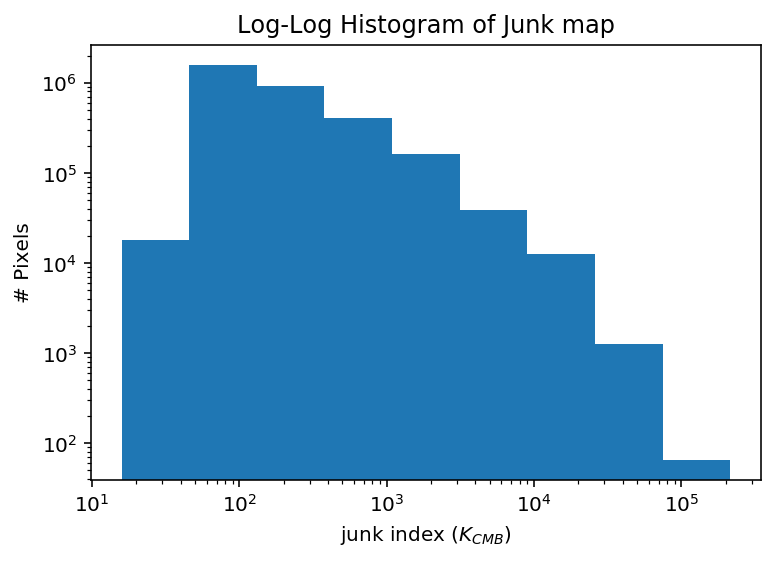

In [240]:
#finding the edges of our hist
number_bins = 10
chosen_map = junk_map
low_edge = np.min(chosen_map)
high_edge = np.max(chosen_map)
log_bins = np.logspace(np.log10(low_edge),np.log10(high_edge), number_bins)

#plotting a log hist to find the regions
plt.hist(chosen_map, bins=log_bins,log=True);
plt.title('Log-Log Histogram of Junk map')
plt.semilogx()
plt.xlabel('junk index ($K_{CMB}$)')
plt.ylabel('# Pixels')
print('the bin edges aka regions',log_bins)

In [241]:
#regions for the boolean mask making code
#grouping some of the larger bins together
#log_bins_modified = np.copy(log_bins)[:9]
#log_bins_modified[-1] = log_bins[-1]
regions = f.bins_to_regions(log_bins)

In [242]:
#splitting boolean map created from junk map
boolean_template, cut_junk_map = f.splitting_step1(regions,chosen_map)

#code to use if you only want to see one region
#boolean_template, cut_junk_map = f.splitting_step1(np.array([[np.min(junk_map)-1, np.max(junk_map)+1]]),junk_map)

min: 15.827994104711252 max: 45.55896063607179
min: 45.56002227218414 max: 131.1418787963703
min: 131.14190779361934 max: 377.48432896478334
min: 377.48688919236884 max: 1086.563861463219
min: 1086.5759068110492 max: 3127.6056251954287
min: 3127.6521767722443 max: 9002.53641884774
min: 9002.722392324358 max: 25911.776581779122
min: 25915.713515132666 max: 74157.65937184915
min: 74922.27386683226 max: 214706.9761995226


In [243]:
#cutting all maps
cuts = []

for i in range(len(CMB_maps)):
    cuts.append(f.splitting_step2(boolean_template, CMB_maps[i]))

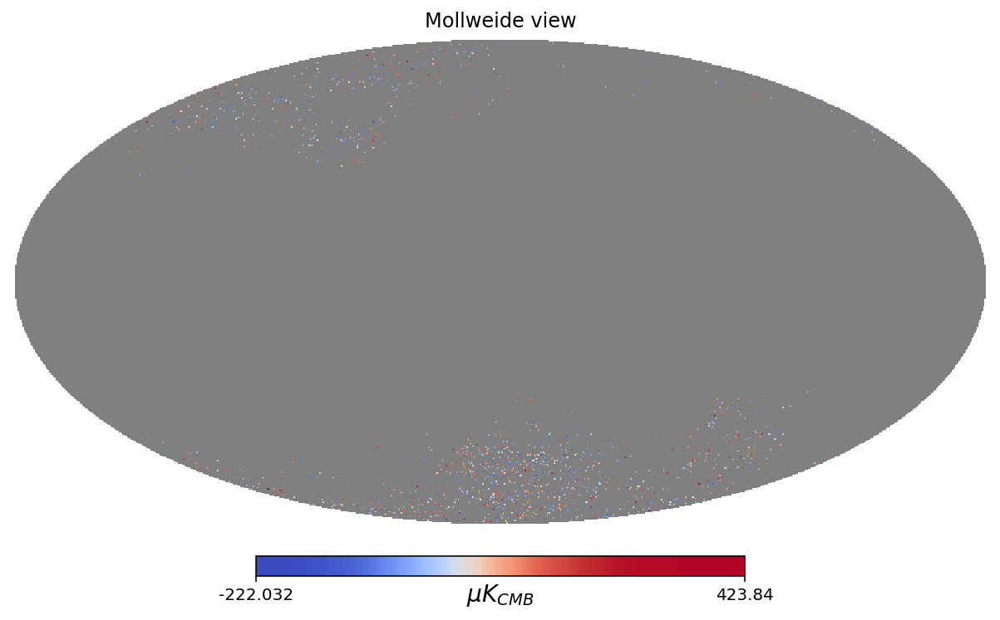

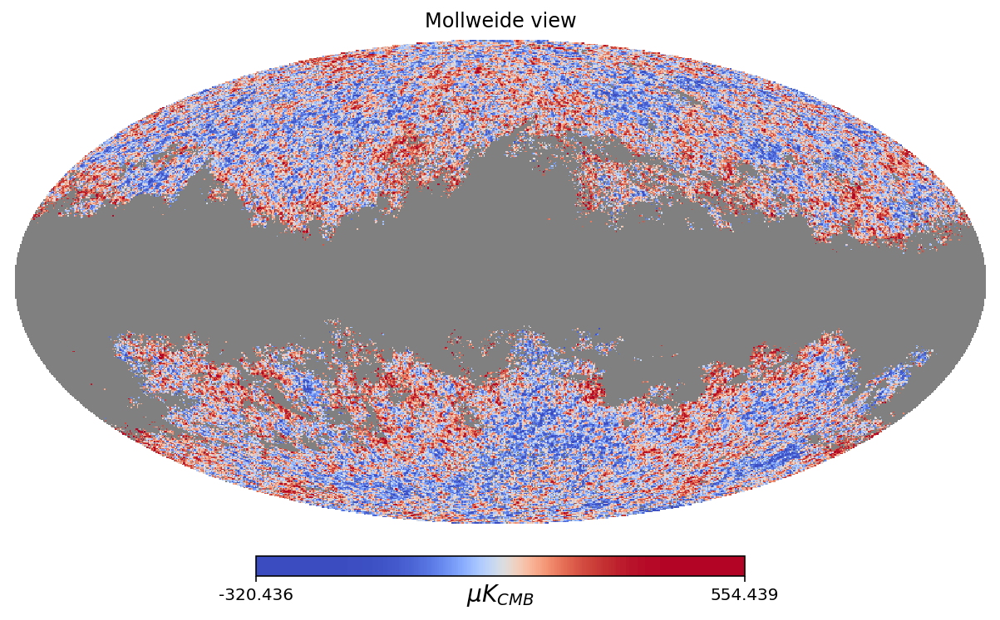

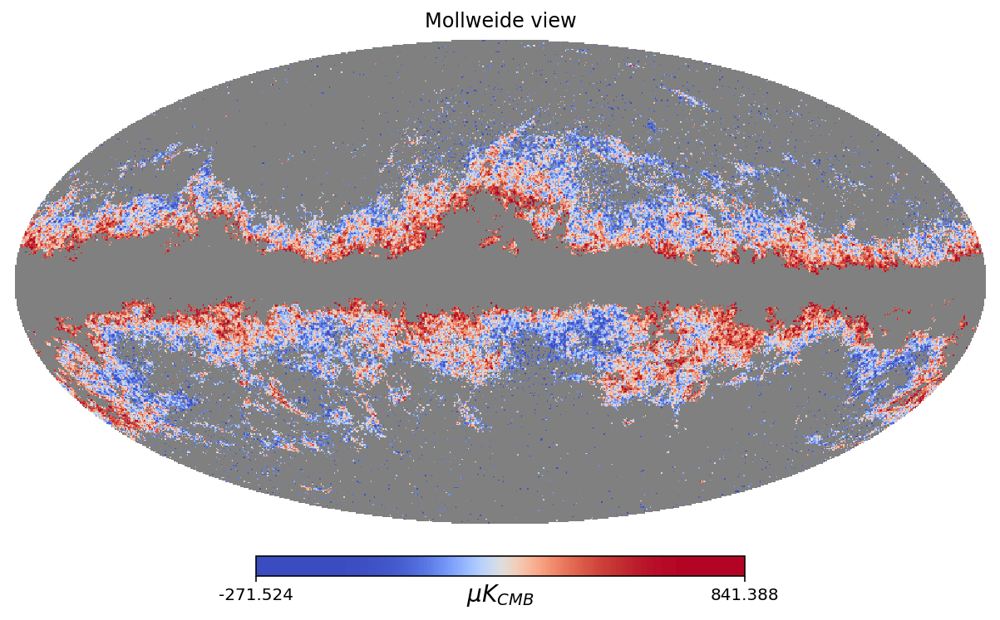

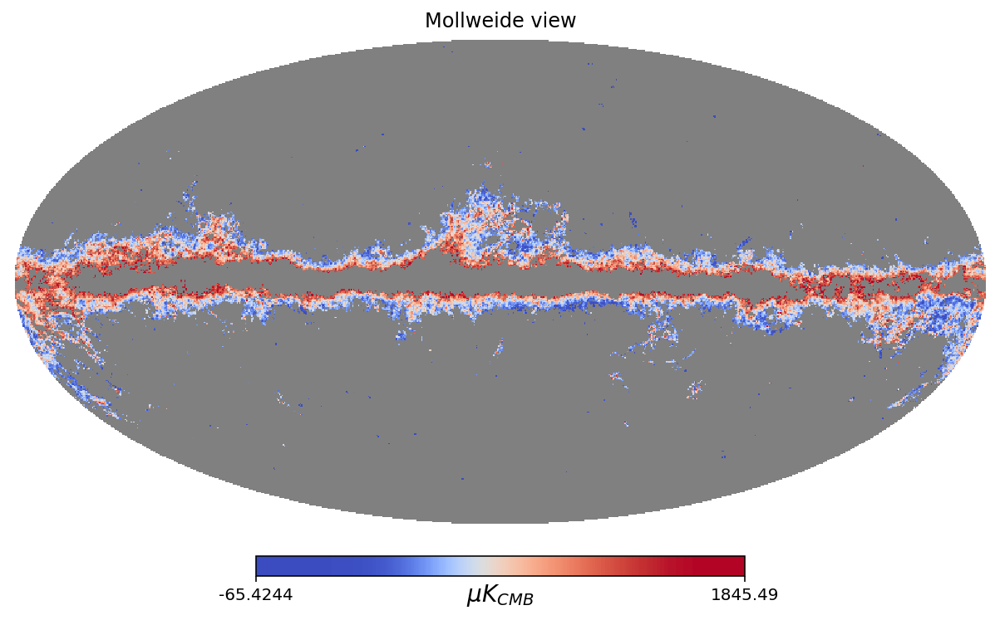

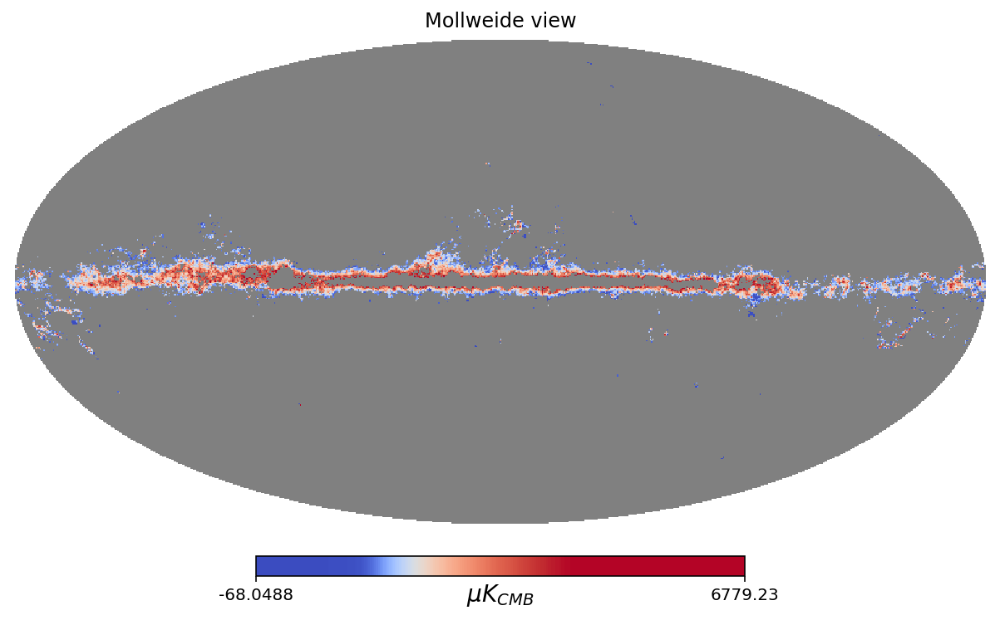

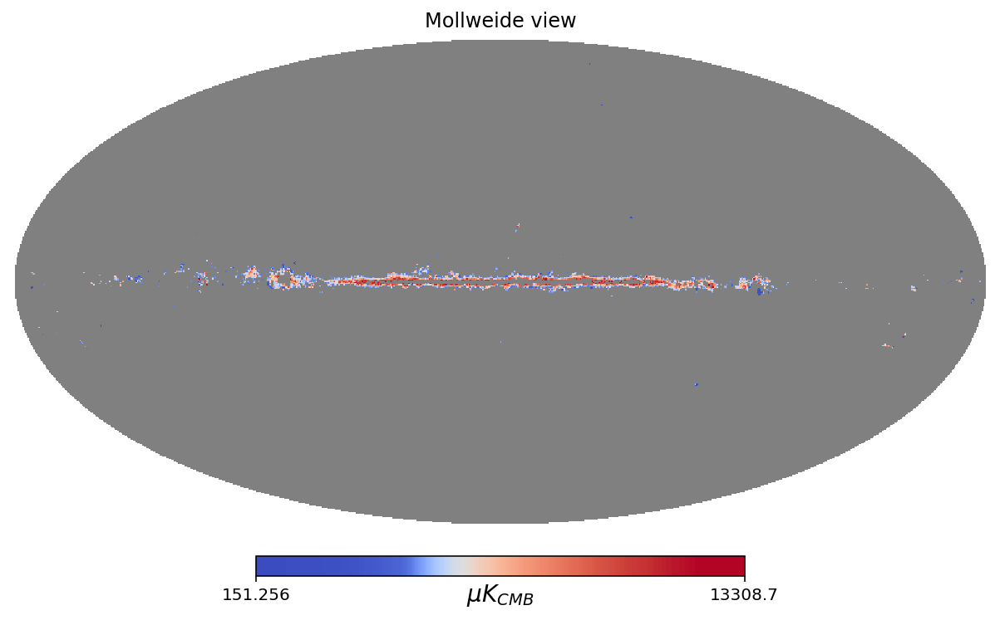

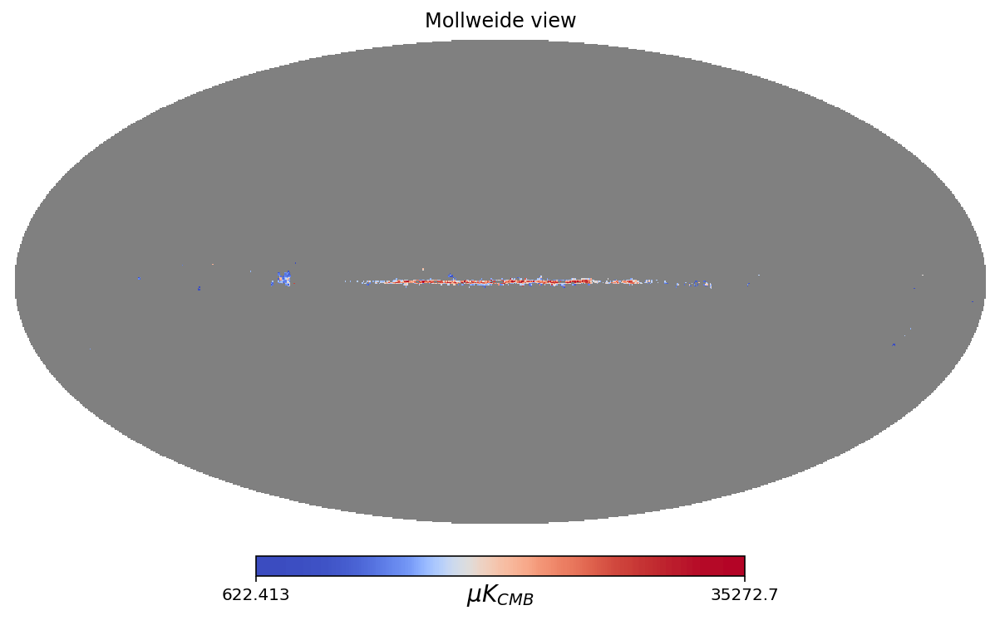

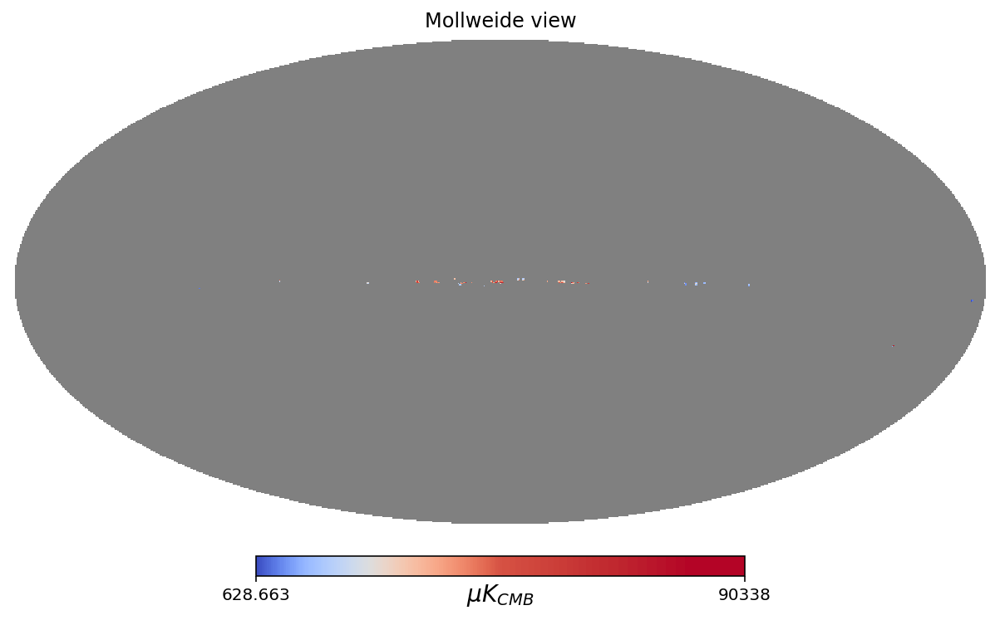

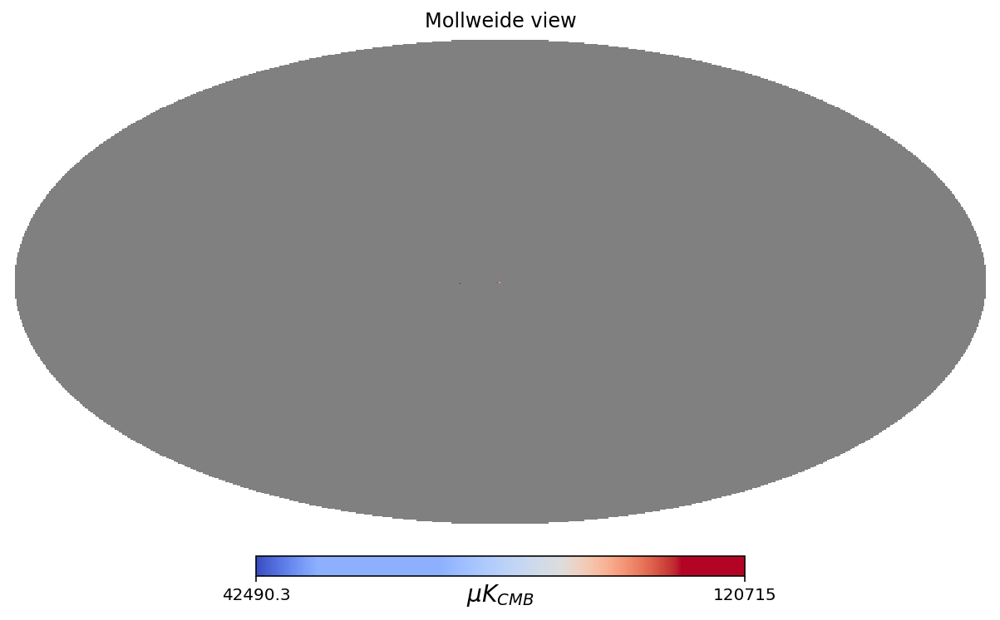

In [244]:
#visualizing the region splitting on the 30 GHz map
regions_vis = []
for i in range(len(boolean_template)):
    regions_vis.append(f.map_and_mask(boolean_template[i], CMB_maps[-1]))
    hp.mollview(regions_vis[-1], unit= u ,norm="hist", cmap = 'coolwarm')


In [245]:
#computing different weights for each region of the cut maps
weights = []
#cuts_region is an array of regions, where each region contains the data from each frequency channel
cuts_region = np.transpose(cuts)
for i in range(len(cuts_region)):
    weights.append(f.compute_weights(cuts_region[i]))
    
#code for weighting a single region
#weights = [f.compute_weights(cuts_region)]


In [246]:
#making the weighted maps for each region, but not yet cutting them up
uncut_weighted_regions = []
for i in range(len(weights)):
    uncut_weighted_regions.append(f.weight_freqs(weights[i], CMB_maps))

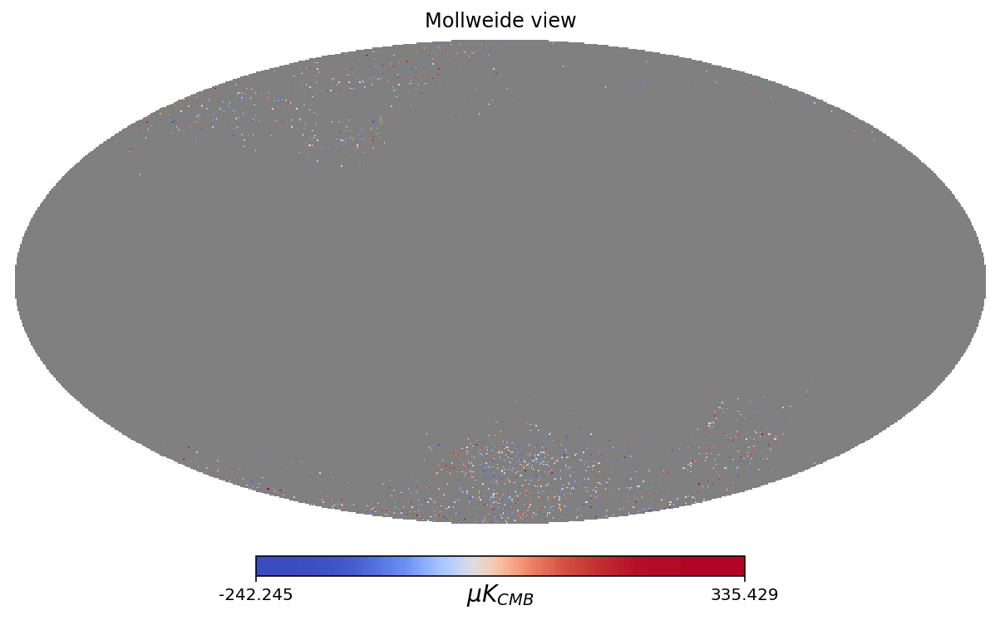

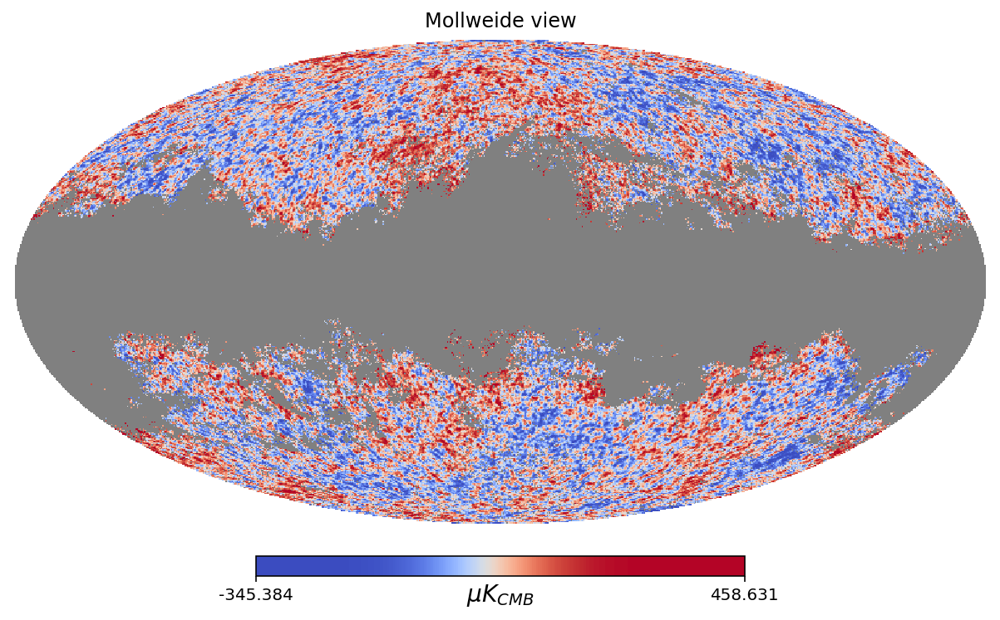

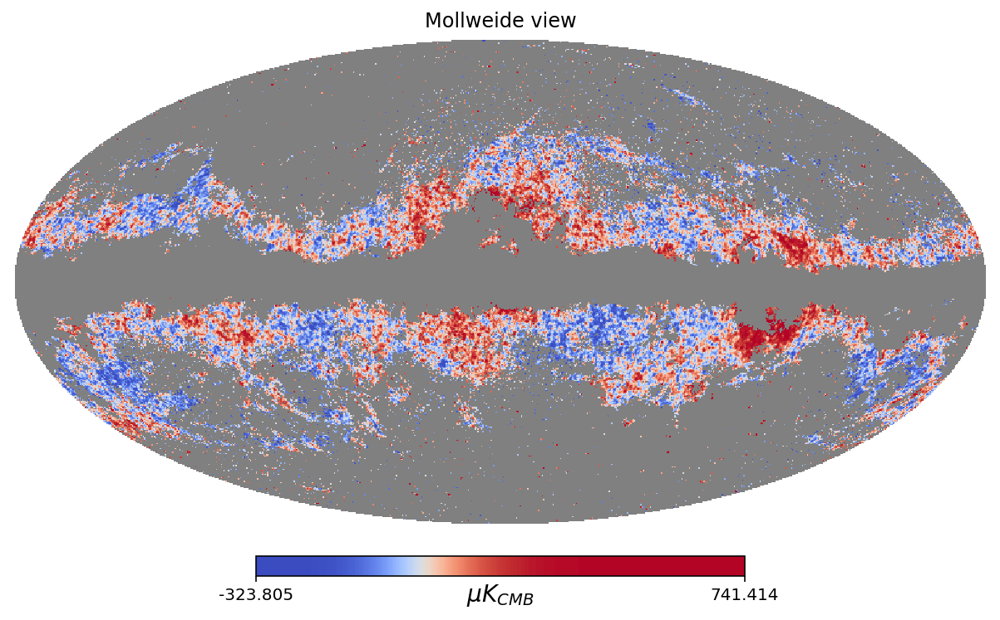

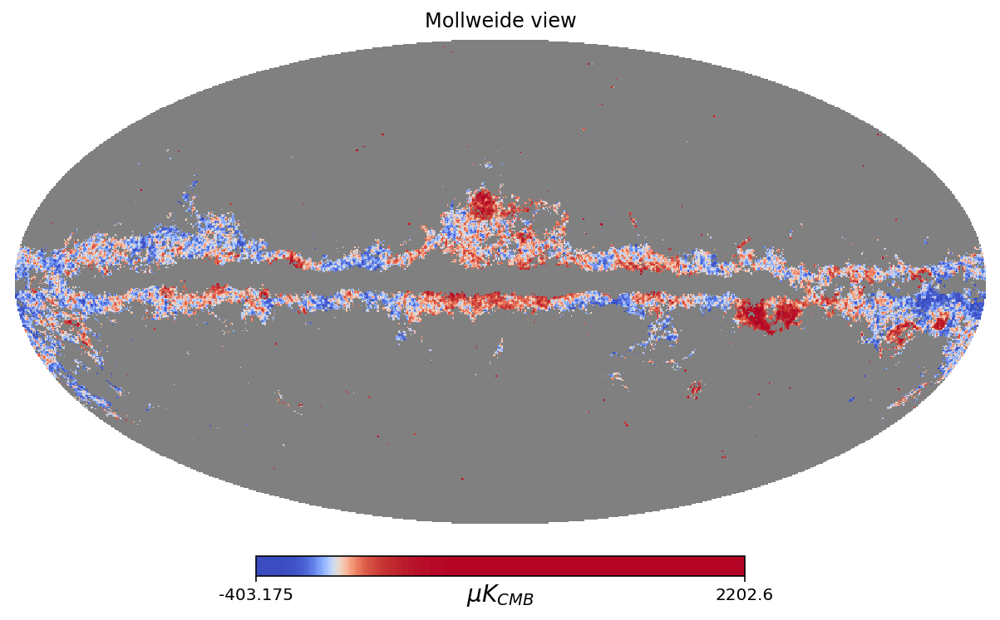

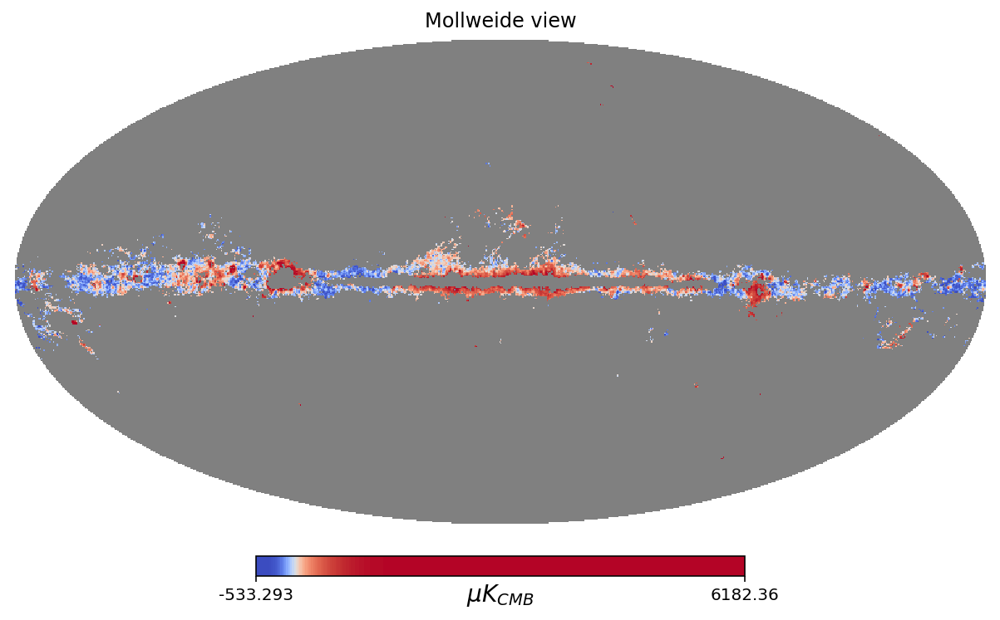

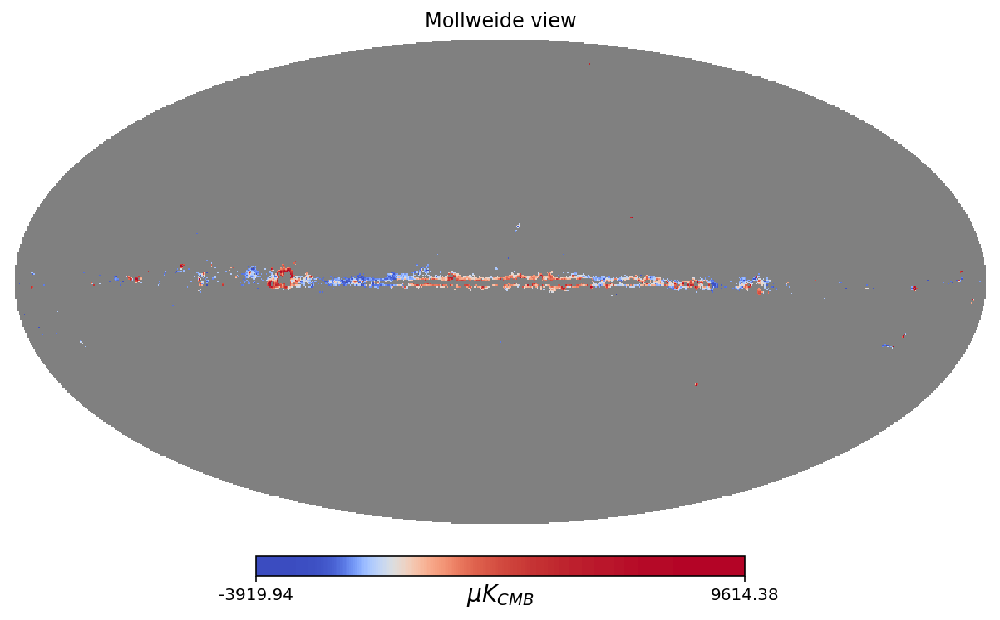

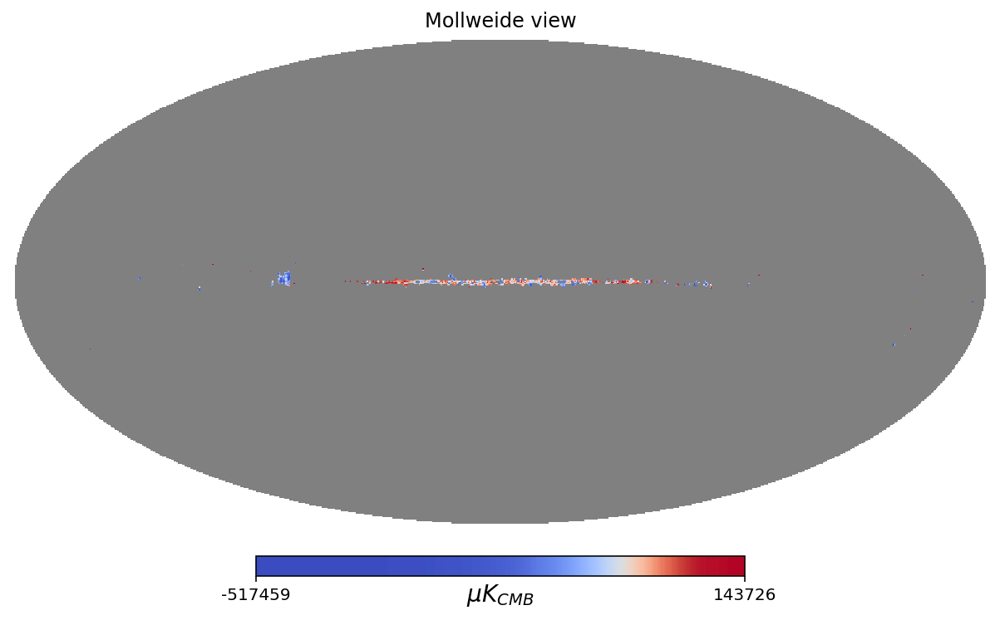

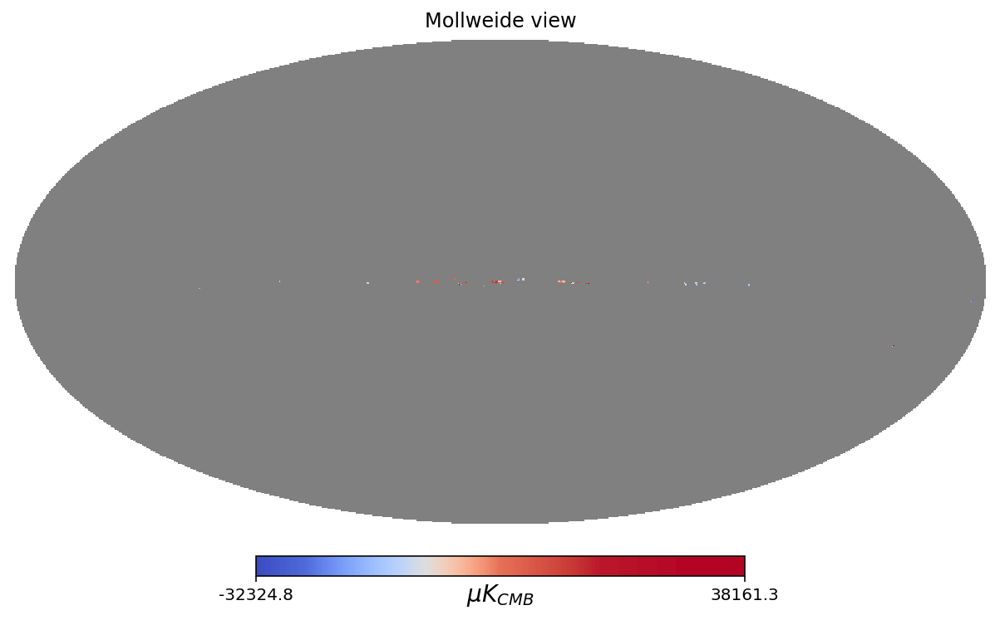

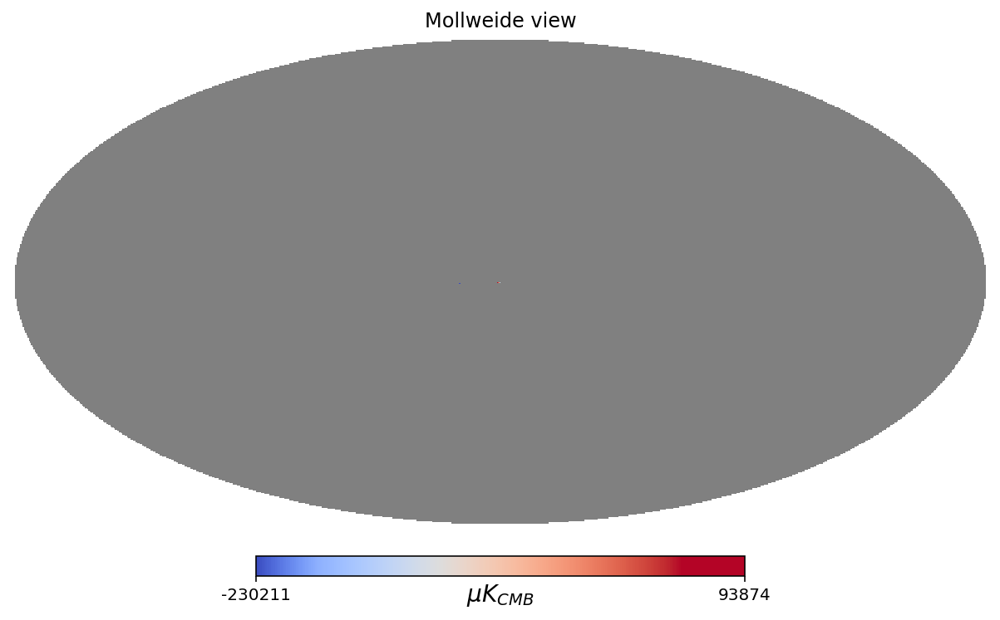

In [247]:
temp_map = []
for i in range(len(boolean_template)):
    temp_map = f.weight_freqs(weights[i], CMB_maps)
    to_plot = f.map_and_mask(boolean_template[i], temp_map)
    hp.mollview(to_plot,unit=u,norm="hist",cmap = 'coolwarm')

In [248]:
#setting the areas outside of regions to zero if the weights don't apply to that region and combining into one map
final_CMB_map = f.recombine_maps(uncut_weighted_regions, boolean_template)

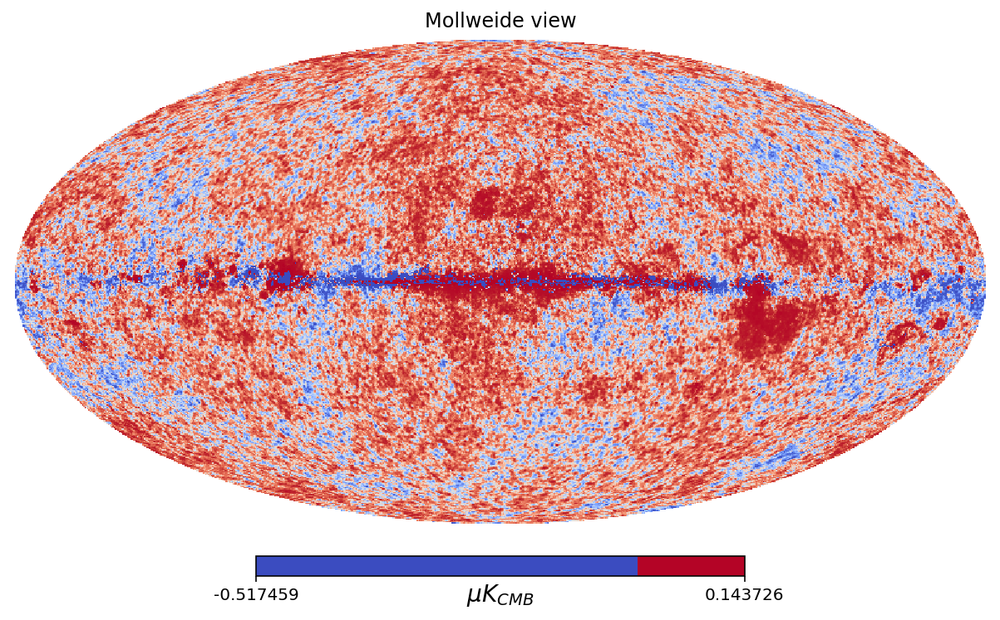

In [249]:
hp.mollview(final_CMB_map*1e-6, unit = u,norm="hist", cmap = 'coolwarm')